**DEER**

In [1]:
import os
import cv2
import numpy as np
from PIL import Image
from IPython.display import display

def load_image(subfolder_name):
    # Define the path to the resources folder
    resources_path = "C:/Users/jaide/resources"

    # Construct the path to the subfolder
    subfolder_path = os.path.join(resources_path, subfolder_name)

    # Get the image file name (assuming it's the same as the subfolder name)
    image_name = subfolder_name + ".png"  # Change the extension if your images are in a different format

    # Construct the full path to the image
    image_path = os.path.join(subfolder_path, image_name)

    # Check if the image file exists
    if os.path.exists(image_path):
        # Open and return the image
        img = Image.open(image_path)
        return img
    else:
        print("Image not found for the given subfolder name.")
        return None

def get_image_array(subfolder_name):
    img = load_image(subfolder_name)
    if img:
        # Convert the image to a NumPy array
        img_array = np.array(img)
        return img_array
    else:
        return None





In [2]:

subfolder_name = input("Enter the name of image you want:" )

# Create variables containing image and its array
globals()[subfolder_name + "_img"] = load_image(subfolder_name)
globals()[subfolder_name + "_arr"] = get_image_array(subfolder_name)

# Check if the variables are created successfully
if globals()[subfolder_name + "_img"] is not None:
    print("Image loaded successfully.")
else:
    print("Failed to load image.")

if globals()[subfolder_name + "_arr"] is not None:
    print("Image array created successfully.")
else:
    print("Failed to create image array.")

Enter the name of image you want: Deer


Image loaded successfully.
Image array created successfully.


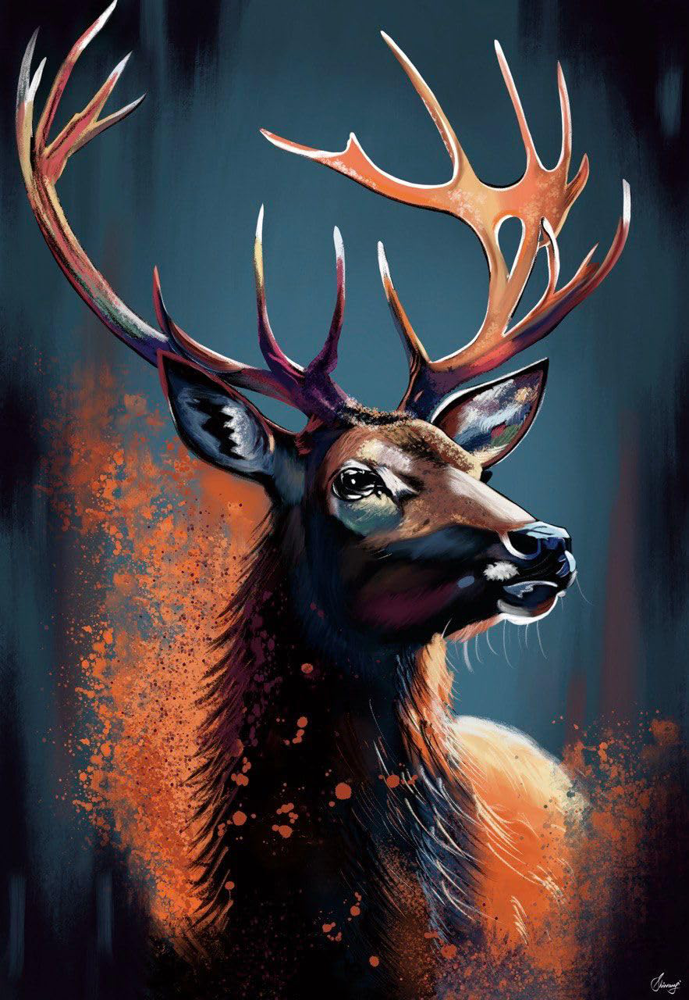

In [3]:
Deer_img

In [4]:
import os
from PIL import Image
from IPython.display import display
import numpy as np

def load_images_in_folder(folder_path):
    # List all files in the folder
    files = os.listdir(folder_path)
    
    # Filter out non-image files
    image_files = [file for file in files if file.endswith(('.jpg', '.jpeg', '.png', '.gif'))]
    
    # Initialize lists to store images and their arrays
    images = []
    image_arrays = []
    
    # Load each image
    for i, image_file in enumerate(image_files, 1):
        image_path = os.path.join(folder_path, image_file)
        img = Image.open(image_path)
        
        # Display the image
        display(img)
        
        # Convert the image to a NumPy array
        img_array = np.array(img)
        
        # Create variable names dynamically
        img_var_name = f"{subfolder_name}_shuffled_{i}"
        img_array_var_name = f"{subfolder_name}_shuffled_{i}_arr"
        
        # Store the image and its array in the lists
        globals()[img_var_name] = img
        globals()[img_array_var_name] = img_array
        
        # Append to the lists
        images.append(img_var_name)
        image_arrays.append(img_array_var_name)
        
    return images, image_arrays




Enter the shuffled subfolder name:  Deer


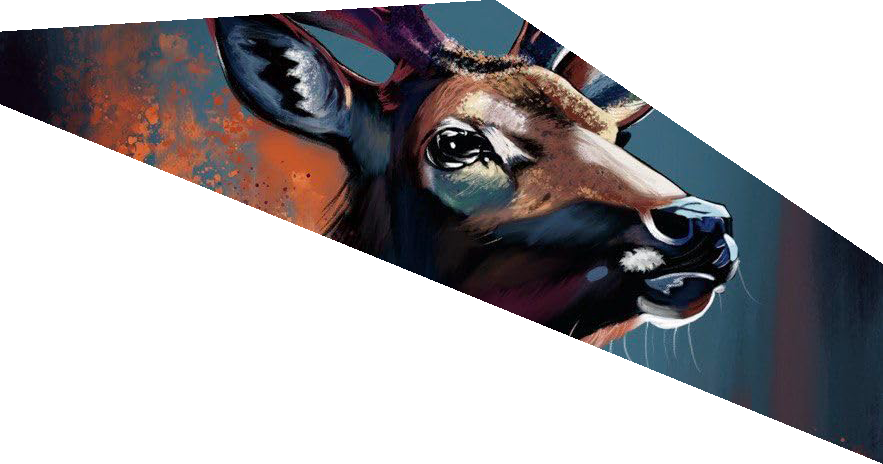

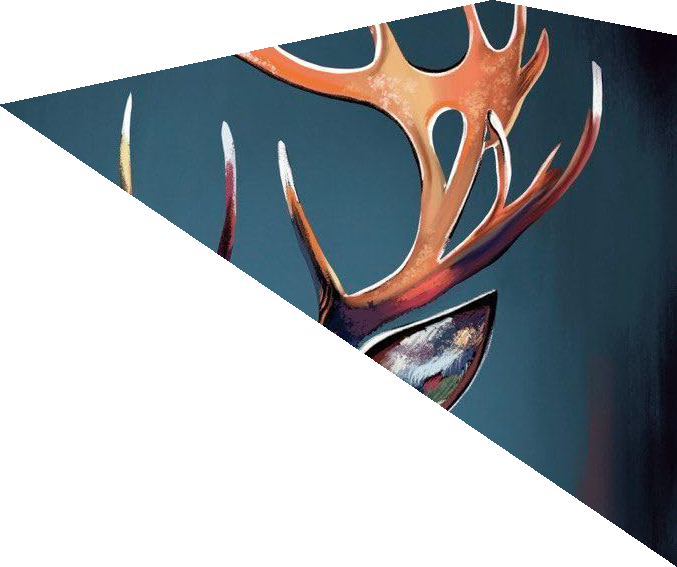

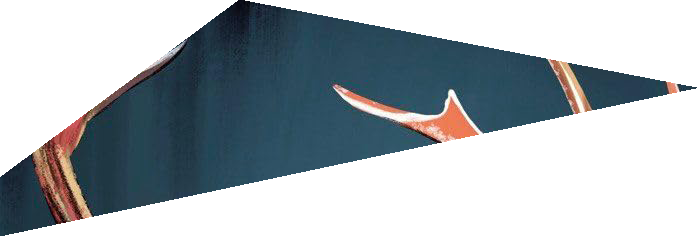

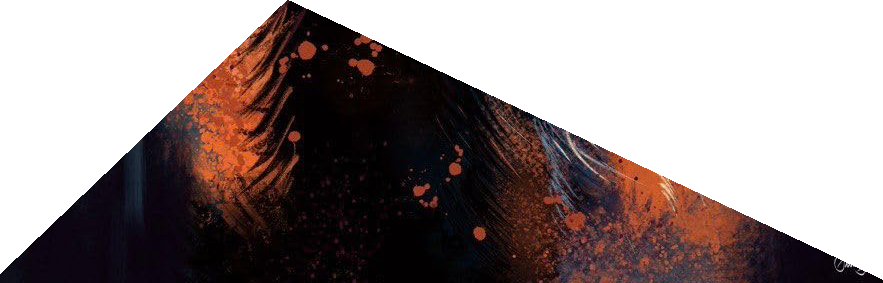

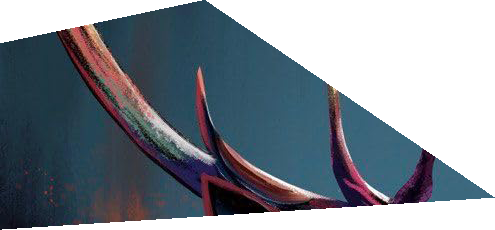

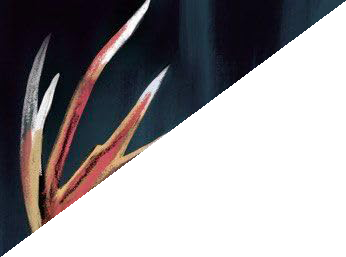

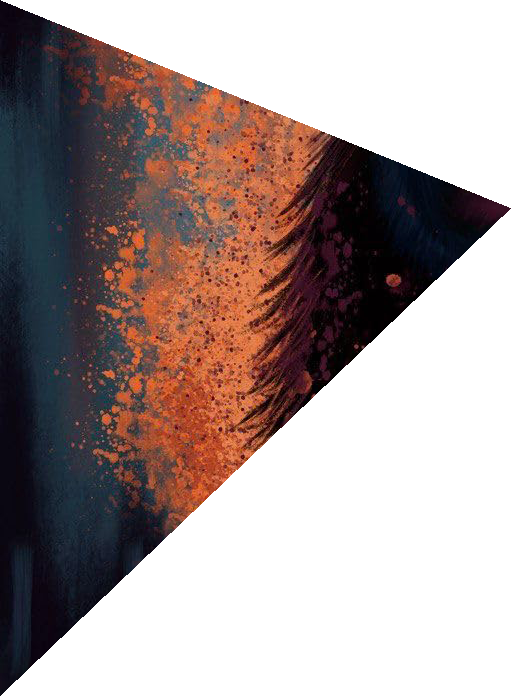

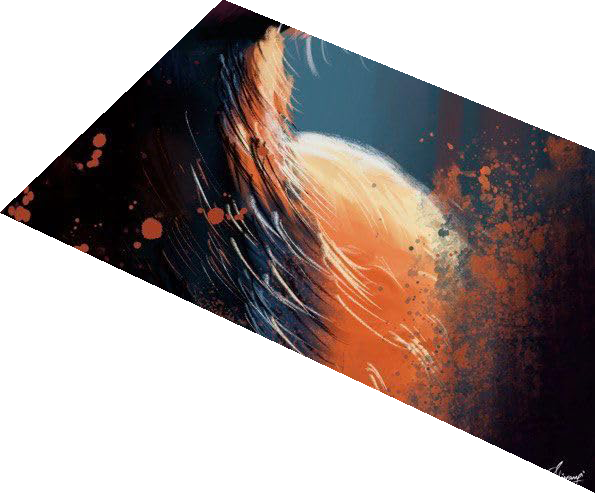

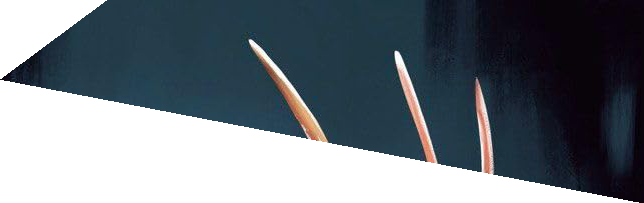

Total number of shuffled images: 9


In [5]:
# Take input from the user
subfolder_name = input("Enter the shuffled subfolder name: ")

# Define the path to the resources folder
resources_path = "C:/Users/jaide/resources"

# Construct the path to the "No rotation" subfolder
no_rotation_path = os.path.join(resources_path, subfolder_name, "No rotation")

# Check if the "No rotation" folder exists
if os.path.exists(no_rotation_path):
    # Load images into variables
    image_variables, image_array_variables = load_images_in_folder(no_rotation_path)
    # Print the total number of shuffled images
    # Create shuffled_images_arr list
    shuffled_images_arr = [globals()[var_name] for var_name in image_array_variables]
    total_images = len(image_variables)
    print(f"Total number of shuffled images: {total_images}")
else:
    print("No 'No rotation' folder found in the given subfolder.")

In [6]:
# Define a function to remove pure white color values from an image array

def remove_pure_white(image_arr, replacement_value):
    # Iterate over each pixel in the image array
    for i in range(image_arr.shape[0]):
        for j in range(image_arr.shape[1]):
            # Check if the pixel corresponds to pure white color
            if np.all(image_arr[i, j] == [255, 255, 255, 0]):
                # Replace the pixel with the replacement value
                image_arr[i, j] = replacement_value
    return image_arr



In [7]:
# Define the replacement value for pure white pixels
replacement_value = [0, 0, 0, 255]  # Replacing pure white with black color with full opacity

# Reassign the values in shuffled_images_arr arrays
shuffled_images_arr = [remove_pure_white(img, replacement_value) for img in shuffled_images_arr]

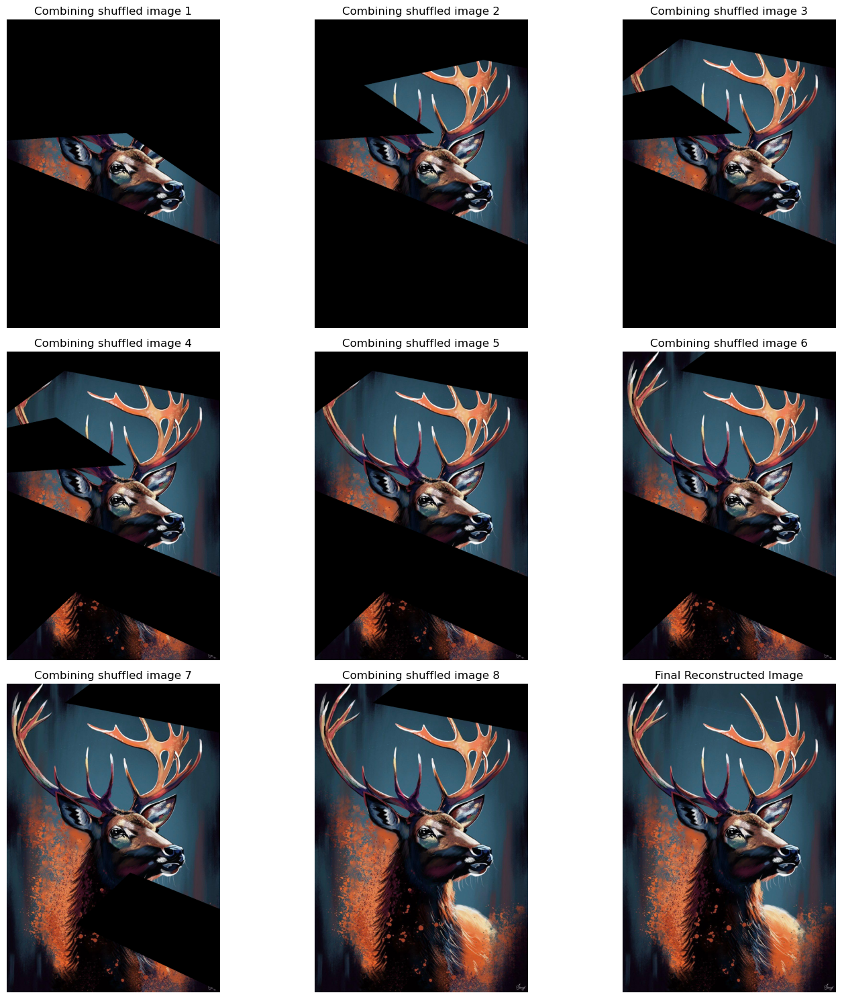

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import base64

# Convert arrays to images
shuffled_images = [cv2.cvtColor(img, cv2.COLOR_RGB2BGR) for img in shuffled_images_arr]
original_image = cv2.cvtColor(Deer_arr, cv2.COLOR_RGB2BGR)

# Use SIFT to extract features
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT for the original image
original_kp, original_desc = sift.detectAndCompute(original_image, None)

# Find the keypoints and descriptors with SIFT for each shuffled image
kp_descs = [sift.detectAndCompute(img, None) for img in shuffled_images]

# BFMatcher with default params
bf = cv2.BFMatcher()

# Calculate the number of images and rows
num_images = len(shuffled_images)
num_rows = (num_images - 1) // 3 + 1

# Create a single figure with subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5 * num_rows))

# Now we have the matches, we can align the images
aligned_images = []
for i, (kp, desc) in enumerate(kp_descs):
    matches = bf.knnMatch(desc, original_desc, k=2)
    good_matches = [m for m, n in matches if m.distance < 0.75*n.distance]
    good_matches.sort(key=lambda x: x.distance)

    src_pts = np.float32([kp[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
    dst_pts = np.float32([original_kp[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    aligned = cv2.warpPerspective(shuffled_images[i], M, (original_image.shape[1], original_image.shape[0]))
    aligned_images.append(aligned)
    
    # Display the intermediate result of combining shuffled images
    combined_image = sum(aligned_images)
    row_index = i // 3
    col_index = i % 3
    axs[row_index, col_index].imshow(cv2.cvtColor(combined_image, cv2.COLOR_BGR2RGB))
    axs[row_index, col_index].set_title(f"Combining shuffled image {i+1}")
    axs[row_index, col_index].axis('off')

# Combine the parts to form the complete image
reconstructed_image = sum(aligned_images)

# Save the final reconstructed image
cv2.imwrite("reconstructed_image.jpg", reconstructed_image)

# Display the final reconstructed image
if num_images > 0:
    last_row = (num_images - 1) // 3  # Correct the calculation for the last row
    last_col = (num_images - 1) % 3  # Correct the calculation for the last column
    axs[last_row, last_col].imshow(cv2.cvtColor(reconstructed_image, cv2.COLOR_BGR2RGB))
    axs[last_row, last_col].set_title("Final Reconstructed Image")
    axs[last_row, last_col].axis('off')

# Hide empty subplots
for i in range(num_images, num_rows * 3):
    row_index = i // 3
    col_index = i % 3
    axs[row_index, col_index].axis('off')

# Show the figure
plt.tight_layout()

plt.show()


**TREE**

In [9]:

subfolder_name = input("Enter the name of image you want:" )

# Create variables containing image and its array
globals()[subfolder_name + "_img"] = load_image(subfolder_name)
globals()[subfolder_name + "_arr"] = get_image_array(subfolder_name)

# Check if the variables are created successfully
if globals()[subfolder_name + "_img"] is not None:
    print("Image loaded successfully.")
else:
    print("Failed to load image.")

if globals()[subfolder_name + "_arr"] is not None:
    print("Image array created successfully.")
else:
    print("Failed to create image array.")

Enter the name of image you want: Tree


Image loaded successfully.
Image array created successfully.


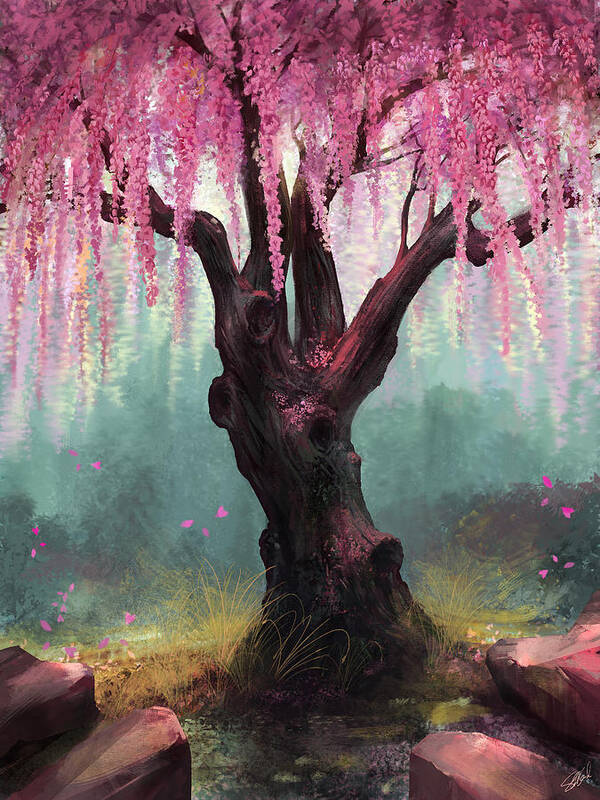

In [10]:
Tree_img

Enter the shuffled subfolder name:  Tree


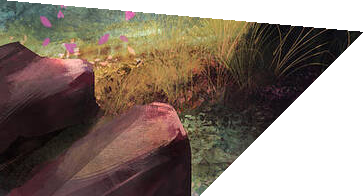

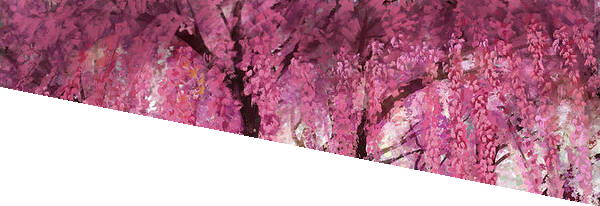

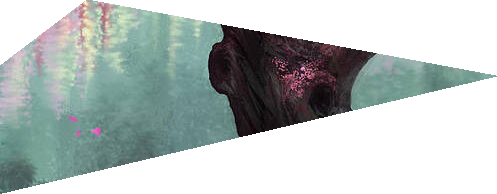

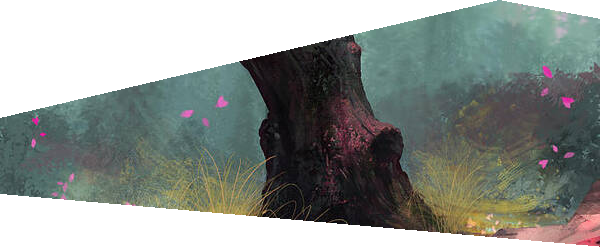

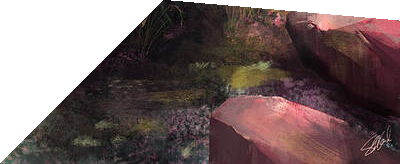

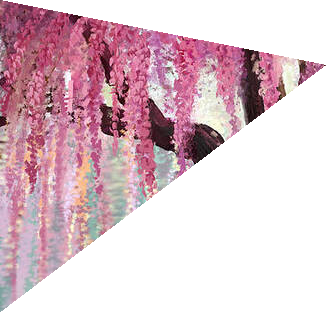

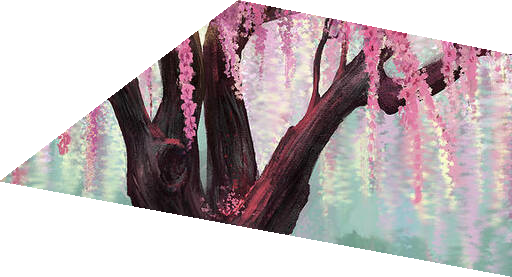

Total number of shuffled images: 7


In [11]:
# Take input from the user
subfolder_name = input("Enter the shuffled subfolder name: ")

# Define the path to the resources folder
resources_path = "C:/Users/jaide/resources"

# Construct the path to the "No rotation" subfolder
no_rotation_path = os.path.join(resources_path, subfolder_name, "No rotation")

# Check if the "No rotation" folder exists
if os.path.exists(no_rotation_path):
    # Load images into variables
    image_variables, image_array_variables = load_images_in_folder(no_rotation_path)
    # Print the total number of shuffled images
    # Create shuffled_images_arr list
    shuffled_images_arr = [globals()[var_name] for var_name in image_array_variables]
    total_images = len(image_variables)
    print(f"Total number of shuffled images: {total_images}")
else:
    print("No 'No rotation' folder found in the given subfolder.")

In [12]:
#Replacing pure while with blacks
shuffled_images_arr = [remove_pure_white(img, replacement_value) for img in shuffled_images_arr]

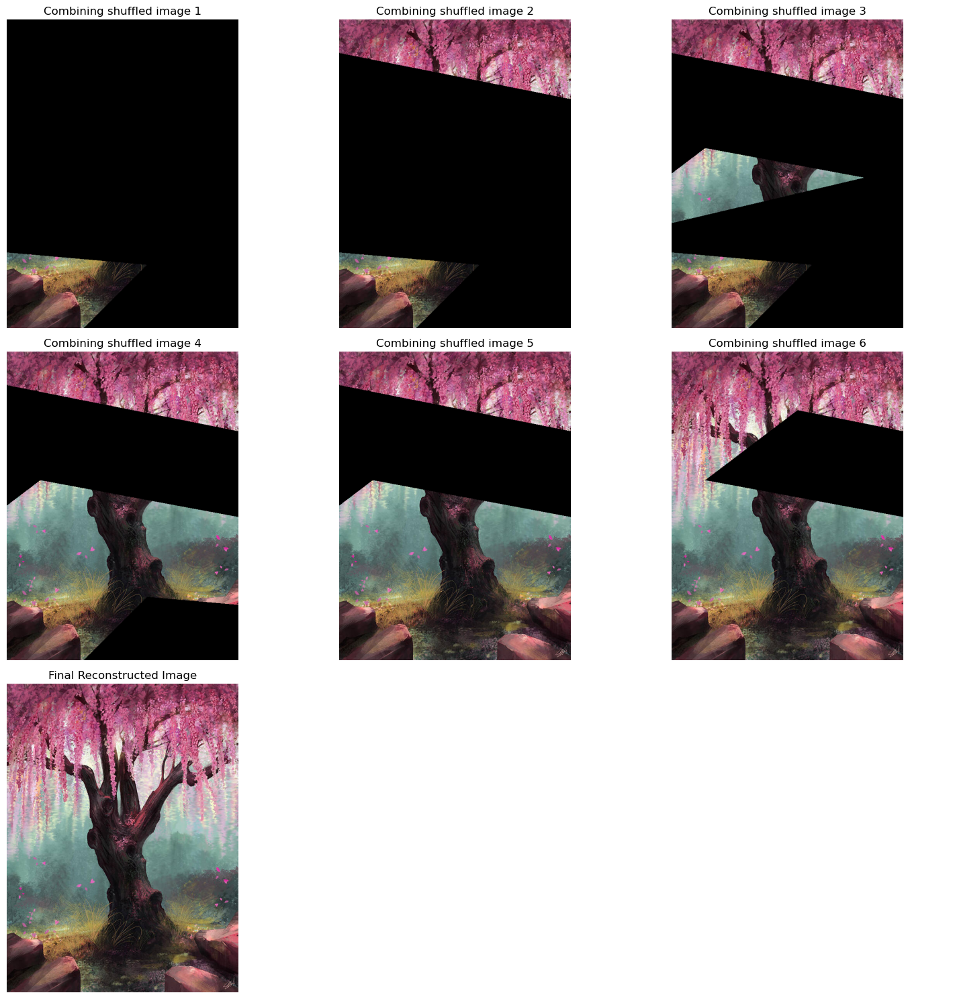

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import base64

# Convert arrays to images
shuffled_images = [cv2.cvtColor(img, cv2.COLOR_RGB2BGR) for img in shuffled_images_arr]
original_image = cv2.cvtColor(Tree_arr, cv2.COLOR_RGB2BGR)

# Use SIFT to extract features
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT for the original image
original_kp, original_desc = sift.detectAndCompute(original_image, None)

# Find the keypoints and descriptors with SIFT for each shuffled image
kp_descs = [sift.detectAndCompute(img, None) for img in shuffled_images]

# BFMatcher with default params
bf = cv2.BFMatcher()

# Calculate the number of images and rows
num_images = len(shuffled_images)
num_rows = (num_images - 1) // 3 + 1

# Create a single figure with subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5 * num_rows))

# Now we have the matches, we can align the images
aligned_images = []
for i, (kp, desc) in enumerate(kp_descs):
    matches = bf.knnMatch(desc, original_desc, k=2)
    good_matches = [m for m, n in matches if m.distance < 0.75*n.distance]
    good_matches.sort(key=lambda x: x.distance)

    src_pts = np.float32([kp[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
    dst_pts = np.float32([original_kp[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    aligned = cv2.warpPerspective(shuffled_images[i], M, (original_image.shape[1], original_image.shape[0]))
    aligned_images.append(aligned)
    
    # Display the intermediate result of combining shuffled images
    combined_image = sum(aligned_images)
    row_index = i // 3
    col_index = i % 3
    axs[row_index, col_index].imshow(cv2.cvtColor(combined_image, cv2.COLOR_BGR2RGB))
    axs[row_index, col_index].set_title(f"Combining shuffled image {i+1}")
    axs[row_index, col_index].axis('off')

# Combine the parts to form the complete image
reconstructed_image = sum(aligned_images)

# Save the final reconstructed image
cv2.imwrite("reconstructed_image.jpg", reconstructed_image)

# Display the final reconstructed image
if num_images > 0:
    last_row = (num_images - 1) // 3  # Correct the calculation for the last row
    last_col = (num_images - 1) % 3  # Correct the calculation for the last column
    axs[last_row, last_col].imshow(cv2.cvtColor(reconstructed_image, cv2.COLOR_BGR2RGB))
    axs[last_row, last_col].set_title("Final Reconstructed Image")
    axs[last_row, last_col].axis('off')

# Hide empty subplots
for i in range(num_images, num_rows * 3):
    row_index = i // 3
    col_index = i % 3
    axs[row_index, col_index].axis('off')

# Show the figure
plt.tight_layout()

plt.show()


**Bear**

In [14]:

subfolder_name = input("Enter the name of image you want:" )

# Create variables containing image and its array
globals()[subfolder_name + "_img"] = load_image(subfolder_name)
globals()[subfolder_name + "_arr"] = get_image_array(subfolder_name)

# Check if the variables are created successfully
if globals()[subfolder_name + "_img"] is not None:
    print("Image loaded successfully.")
else:
    print("Failed to load image.")

if globals()[subfolder_name + "_arr"] is not None:
    print("Image array created successfully.")
else:
    print("Failed to create image array.")

Enter the name of image you want: Bear


Image loaded successfully.
Image array created successfully.


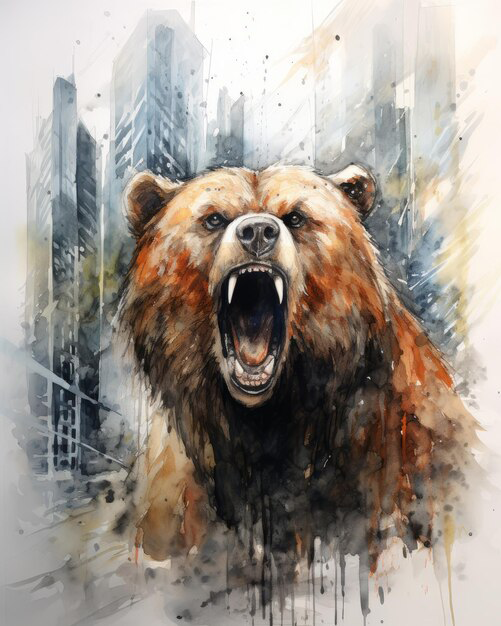

In [15]:
Bear_img

Enter the shuffled subfolder name:  Bear


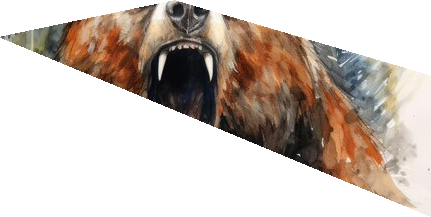

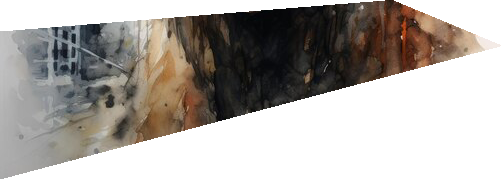

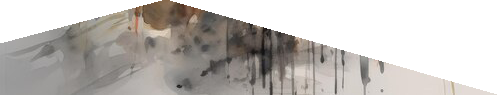

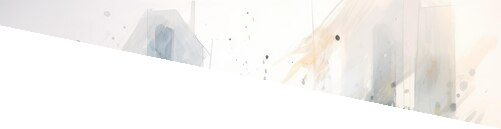

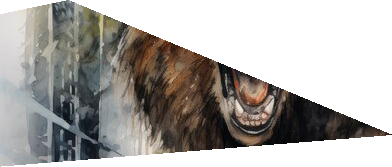

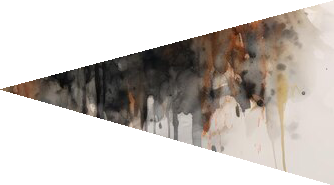

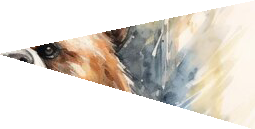

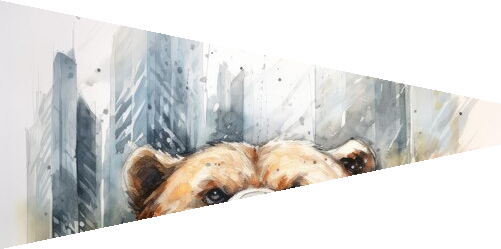

Total number of shuffled images: 8


In [16]:
# Take input from the user
subfolder_name = input("Enter the shuffled subfolder name: ")

# Define the path to the resources folder
resources_path = "C:/Users/jaide/resources"

# Construct the path to the "No rotation" subfolder
no_rotation_path = os.path.join(resources_path, subfolder_name, "No rotation")

# Check if the "No rotation" folder exists
if os.path.exists(no_rotation_path):
    # Load images into variables
    image_variables, image_array_variables = load_images_in_folder(no_rotation_path)
    # Print the total number of shuffled images
    # Create shuffled_images_arr list
    shuffled_images_arr = [globals()[var_name] for var_name in image_array_variables]
    total_images = len(image_variables)
    print(f"Total number of shuffled images: {total_images}")
else:
    print("No 'No rotation' folder found in the given subfolder.")

In [17]:
#Replacing pure while with blacks
shuffled_images_arr = [remove_pure_white(img, replacement_value) for img in shuffled_images_arr]

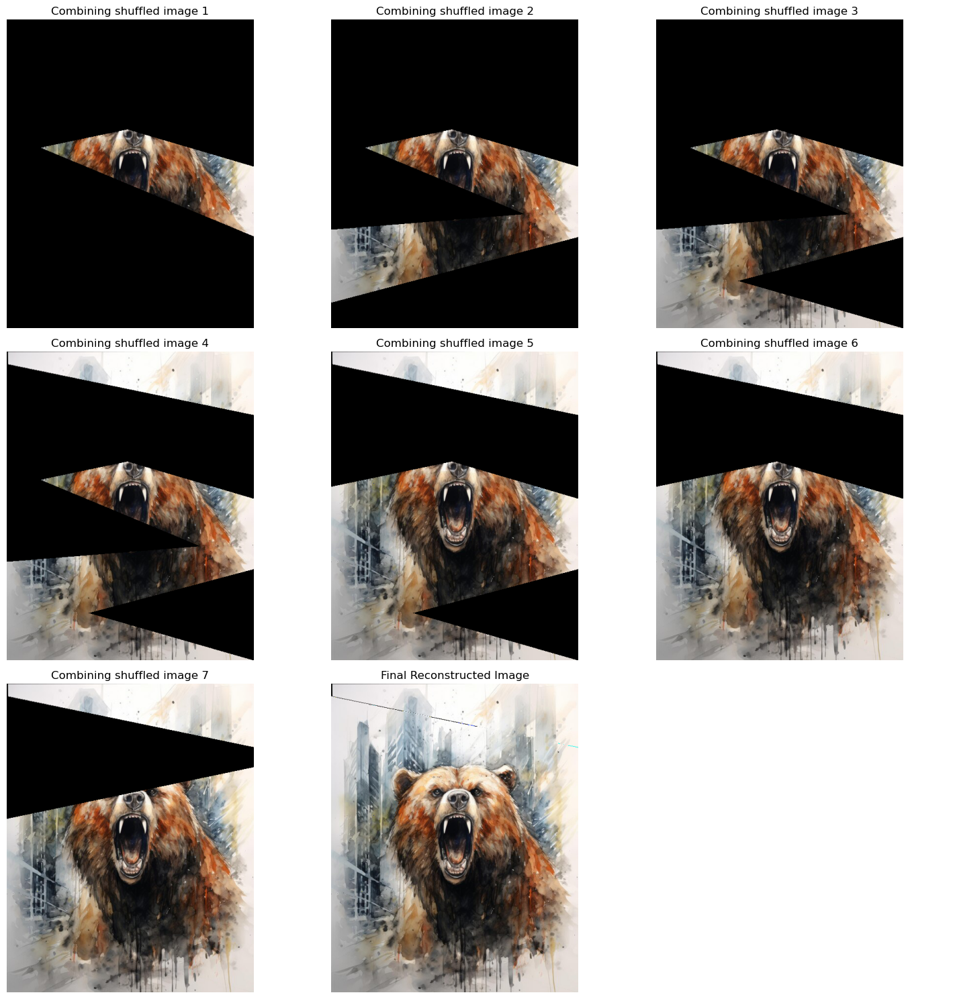

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import base64

# Convert arrays to images
shuffled_images = [cv2.cvtColor(img, cv2.COLOR_RGB2BGR) for img in shuffled_images_arr]
original_image = cv2.cvtColor(Bear_arr, cv2.COLOR_RGB2BGR)

# Use SIFT to extract features
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT for the original image
original_kp, original_desc = sift.detectAndCompute(original_image, None)

# Find the keypoints and descriptors with SIFT for each shuffled image
kp_descs = [sift.detectAndCompute(img, None) for img in shuffled_images]

# BFMatcher with default params
bf = cv2.BFMatcher()

# Calculate the number of images and rows
num_images = len(shuffled_images)
num_rows = (num_images - 1) // 3 + 1

# Create a single figure with subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5 * num_rows))

# Now we have the matches, we can align the images
aligned_images = []
for i, (kp, desc) in enumerate(kp_descs):
    matches = bf.knnMatch(desc, original_desc, k=2)
    good_matches = [m for m, n in matches if m.distance < 0.75*n.distance]
    good_matches.sort(key=lambda x: x.distance)

    src_pts = np.float32([kp[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
    dst_pts = np.float32([original_kp[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    aligned = cv2.warpPerspective(shuffled_images[i], M, (original_image.shape[1], original_image.shape[0]))
    aligned_images.append(aligned)
    
    # Display the intermediate result of combining shuffled images
    combined_image = sum(aligned_images)
    row_index = i // 3
    col_index = i % 3
    axs[row_index, col_index].imshow(cv2.cvtColor(combined_image, cv2.COLOR_BGR2RGB))
    axs[row_index, col_index].set_title(f"Combining shuffled image {i+1}")
    axs[row_index, col_index].axis('off')

# Combine the parts to form the complete image
reconstructed_image = sum(aligned_images)

# Save the final reconstructed image
cv2.imwrite("reconstructed_image.jpg", reconstructed_image)

# Display the final reconstructed image
if num_images > 0:
    last_row = (num_images - 1) // 3  # Correct the calculation for the last row
    last_col = (num_images - 1) % 3  # Correct the calculation for the last column
    axs[last_row, last_col].imshow(cv2.cvtColor(reconstructed_image, cv2.COLOR_BGR2RGB))
    axs[last_row, last_col].set_title("Final Reconstructed Image")
    axs[last_row, last_col].axis('off')

# Hide empty subplots
for i in range(num_images, num_rows * 3):
    row_index = i // 3
    col_index = i % 3
    axs[row_index, col_index].axis('off')

# Show the figure
plt.tight_layout()

plt.show()


**CAR**

In [19]:
subfolder_name = input("Enter the name of image you want:" )

# Create variables containing image and its array
globals()[subfolder_name + "_img"] = load_image(subfolder_name)
globals()[subfolder_name + "_arr"] = get_image_array(subfolder_name)

# Check if the variables are created successfully
if globals()[subfolder_name + "_img"] is not None:
    print("Image loaded successfully.")
else:
    print("Failed to load image.")

if globals()[subfolder_name + "_arr"] is not None:
    print("Image array created successfully.")
else:
    print("Failed to create image array.")

Enter the name of image you want: Car


Image loaded successfully.
Image array created successfully.


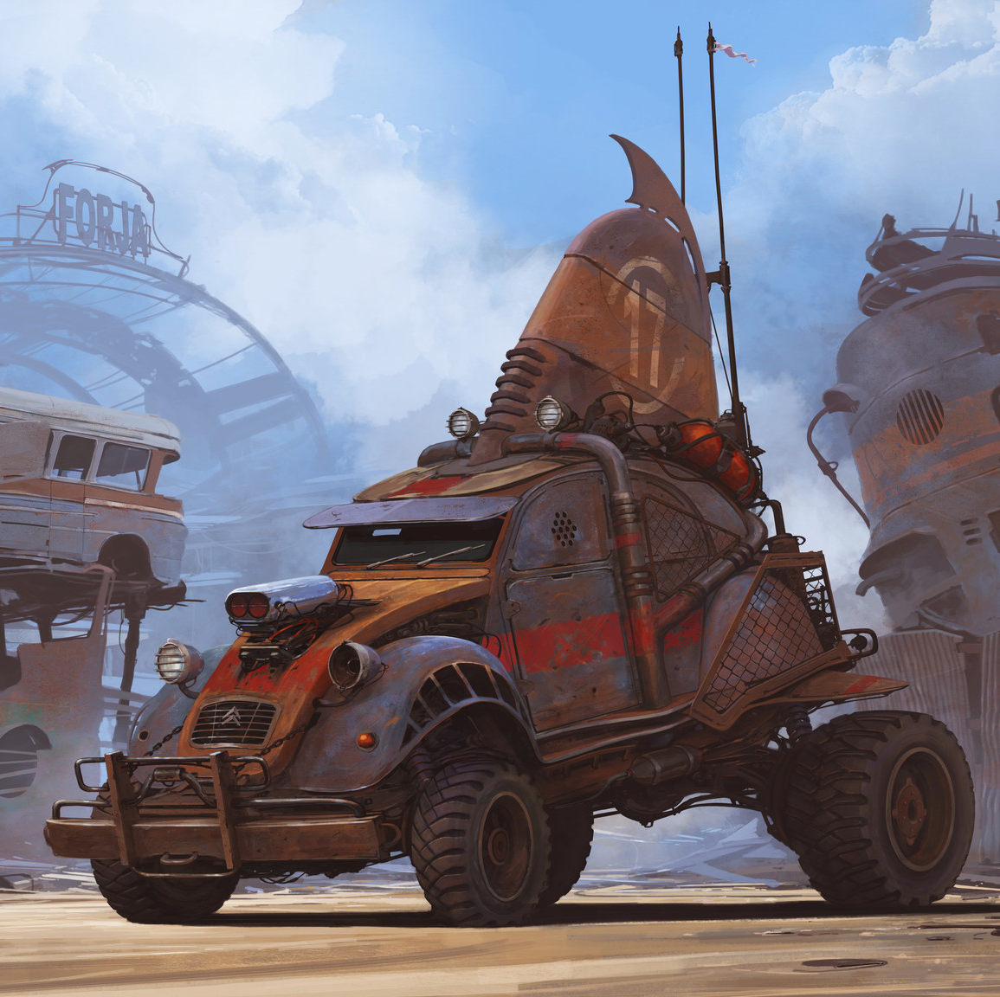

In [20]:
Car_img

Enter the shuffled subfolder name:  Car


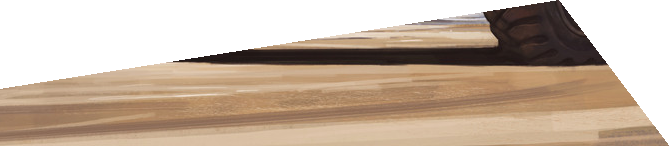

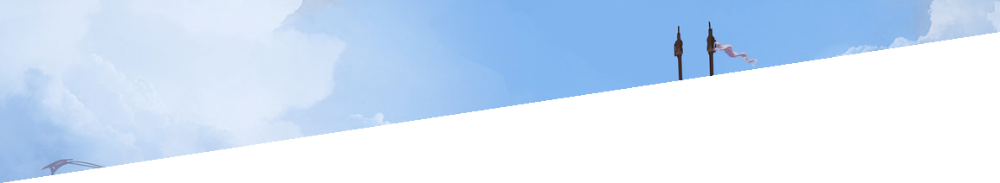

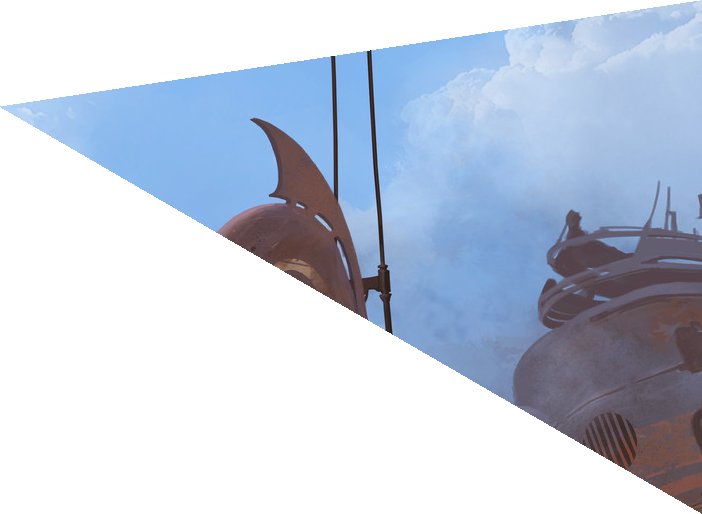

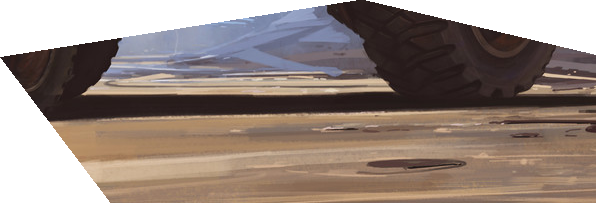

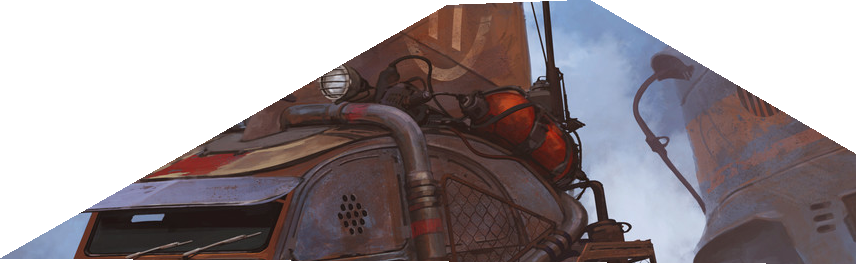

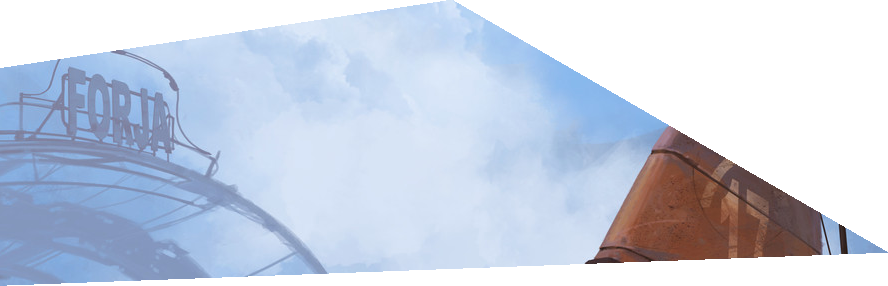

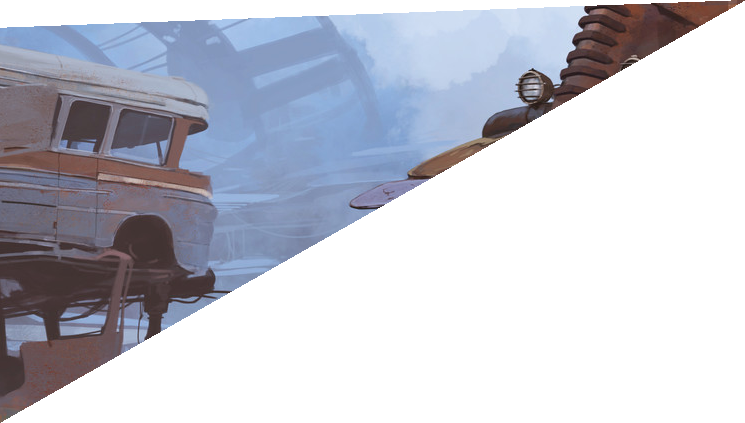

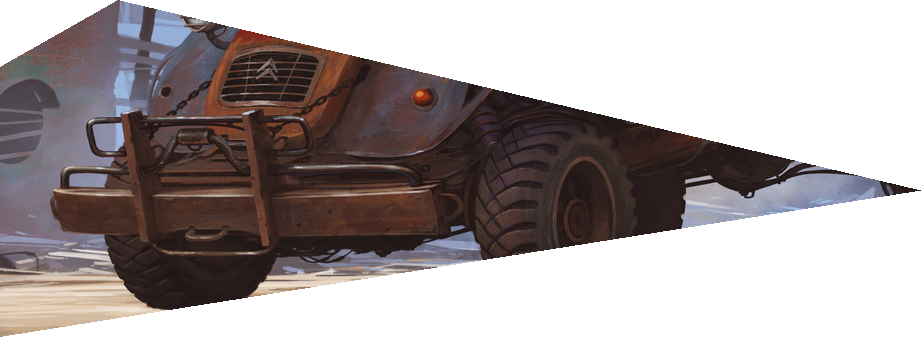

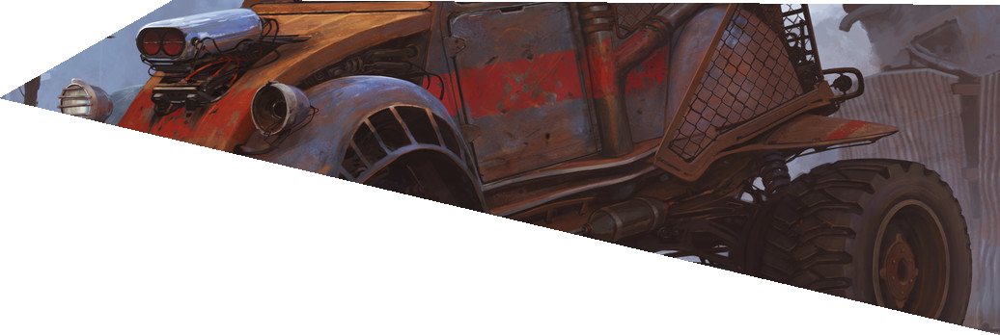

Total number of shuffled images: 9


In [21]:
# Take input from the user
subfolder_name = input("Enter the shuffled subfolder name: ")

# Define the path to the resources folder
resources_path = "C:/Users/jaide/resources"

# Construct the path to the "No rotation" subfolder
no_rotation_path = os.path.join(resources_path, subfolder_name, "No rotation")

# Check if the "No rotation" folder exists
if os.path.exists(no_rotation_path):
    # Load images into variables
    image_variables, image_array_variables = load_images_in_folder(no_rotation_path)
    # Print the total number of shuffled images
    # Create shuffled_images_arr list
    shuffled_images_arr = [globals()[var_name] for var_name in image_array_variables]
    total_images = len(image_variables)
    print(f"Total number of shuffled images: {total_images}")
else:
    print("No 'No rotation' folder found in the given subfolder.")

In [22]:
#Replacing pure while with blacks
shuffled_images_arr = [remove_pure_white(img, replacement_value) for img in shuffled_images_arr]

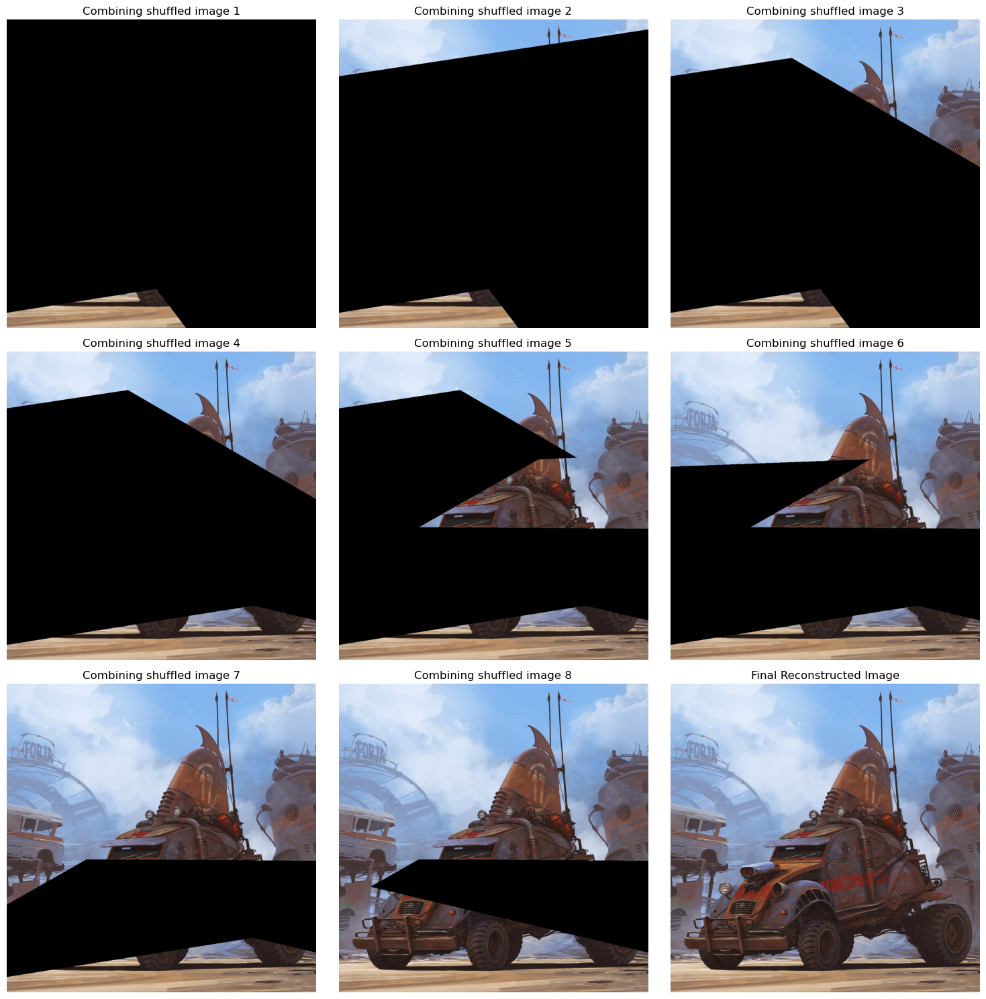

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import base64

# Convert arrays to images
shuffled_images = [cv2.cvtColor(img, cv2.COLOR_RGB2BGR) for img in shuffled_images_arr]
original_image = cv2.cvtColor(Car_arr, cv2.COLOR_RGB2BGR)

# Use SIFT to extract features
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT for the original image
original_kp, original_desc = sift.detectAndCompute(original_image, None)

# Find the keypoints and descriptors with SIFT for each shuffled image
kp_descs = [sift.detectAndCompute(img, None) for img in shuffled_images]

# BFMatcher with default params
bf = cv2.BFMatcher()

# Calculate the number of images and rows
num_images = len(shuffled_images)
num_rows = (num_images - 1) // 3 + 1

# Create a single figure with subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5 * num_rows))

# Now we have the matches, we can align the images
aligned_images = []
for i, (kp, desc) in enumerate(kp_descs):
    matches = bf.knnMatch(desc, original_desc, k=2)
    good_matches = [m for m, n in matches if m.distance < 0.75*n.distance]
    good_matches.sort(key=lambda x: x.distance)

    src_pts = np.float32([kp[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
    dst_pts = np.float32([original_kp[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    aligned = cv2.warpPerspective(shuffled_images[i], M, (original_image.shape[1], original_image.shape[0]))
    aligned_images.append(aligned)
    
    # Display the intermediate result of combining shuffled images
    combined_image = sum(aligned_images)
    row_index = i // 3
    col_index = i % 3
    axs[row_index, col_index].imshow(cv2.cvtColor(combined_image, cv2.COLOR_BGR2RGB))
    axs[row_index, col_index].set_title(f"Combining shuffled image {i+1}")
    axs[row_index, col_index].axis('off')

# Combine the parts to form the complete image
reconstructed_image = sum(aligned_images)

# Save the final reconstructed image
cv2.imwrite("reconstructed_image.jpg", reconstructed_image)

# Display the final reconstructed image
if num_images > 0:
    last_row = (num_images - 1) // 3  # Correct the calculation for the last row
    last_col = (num_images - 1) % 3  # Correct the calculation for the last column
    axs[last_row, last_col].imshow(cv2.cvtColor(reconstructed_image, cv2.COLOR_BGR2RGB))
    axs[last_row, last_col].set_title("Final Reconstructed Image")
    axs[last_row, last_col].axis('off')

# Hide empty subplots
for i in range(num_images, num_rows * 3):
    row_index = i // 3
    col_index = i % 3
    axs[row_index, col_index].axis('off')

# Show the figure
plt.tight_layout()

plt.show()
